# Analysis of Road Networks Using Graph Theory: <br> Comparisons Between Efficient and Inefficient Road Networks
**Authors:** Ahmet Onur Akman, Marco Raimondi, Andrea Mazzuco.

In this project, we will be analyzing city road graphs and calculating various centrality measures to understand their impact on traffic efficiency. By comparing the centrality scores of different measures, we will aim to determine which measure is the most effective at predicting traffic efficiency in a city's road network. This analysis will provide insights into the relationship between centrality measures and traffic efficiency and may inform future research on the topic.

In [1]:
import osmnx as ox
import networkx as nx
from community import community_louvain
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
from scipy.stats import entropy
import random

import warnings
warnings.filterwarnings('ignore')

## Variables and Plotting Functions

In [2]:
RED = 'firebrick'
GREEN = 'green'

In [3]:
def draw_boxplot(xdata, ydata, xlabel, ylabel):
    
    plot_data = [list(x.values()) for x in ydata]

    fig = plt.figure(figsize =(6, 4))

    # Creating axes instance
    ax = fig.add_axes([0, 0, 1, 1])

    # Creating plot
    bp = ax.boxplot(plot_data)

    ax.set_xticklabels(xdata, fontsize=11)
    ax.set_xlabel(xlabel, fontsize=15)
    ax.set_ylabel(ylabel, fontsize=15)

    plt.setp(bp['medians'], color='skyblue', linewidth = 3)
    plt.setp(bp['fliers'], marker='o')

    plt.setp(bp['boxes'][0], color=RED, linewidth = 3)
    plt.setp(bp['boxes'][1], color=RED, linewidth = 3)
    plt.setp(bp['boxes'][2], color=RED, linewidth = 3)
    plt.setp(bp['boxes'][3], color=GREEN, linewidth = 3)
    plt.setp(bp['boxes'][4], color=GREEN, linewidth = 3)
    plt.setp(bp['boxes'][5], color=GREEN, linewidth = 3)
    
    ax.grid(False)
    ax.yaxis.grid(True, linestyle='-', which='major', color='lightgrey', alpha= 1)
    
    plt.show()

In [55]:
def draw_boxplot_no(xdata, ydata, xlabel, ylabel):
    
    plot_data = [list(x.values()) for x in ydata]

    fig = plt.figure(figsize =(6, 4))

    # Creating axes instance
    ax = fig.add_axes([0, 0, 1, 1])

    # Creating plot
    bp = ax.boxplot(plot_data, 0, '')

    ax.set_xticklabels(xdata, fontsize=11)
    ax.set_xlabel(xlabel, fontsize=15)
    ax.set_ylabel(ylabel, fontsize=15)

    plt.setp(bp['medians'], color='skyblue', linewidth = 3)
    plt.setp(bp['fliers'], marker='o')

    plt.setp(bp['boxes'][0], color=RED, linewidth = 3)
    plt.setp(bp['boxes'][1], color=RED, linewidth = 3)
    plt.setp(bp['boxes'][2], color=RED, linewidth = 3)
    plt.setp(bp['boxes'][3], color=GREEN, linewidth = 3)
    plt.setp(bp['boxes'][4], color=GREEN, linewidth = 3)
    plt.setp(bp['boxes'][5], color=GREEN, linewidth = 3)
    
    ax.grid(False)
    ax.yaxis.grid(True, linestyle='-', which='major', color='lightgrey', alpha= 1)
    
    plt.show()

In [4]:
def draw_bar(xdata, ydata, title, margin):
    
    fig, ax = plt.subplots()
    
    ax.bar(xdata[:3], ydata[:3], color=RED)
    ax.bar(xdata[3:], ydata[3:], color=GREEN)
    
    ax.set_ylim([min(ydata)-margin, max(ydata)+margin])
    ax.set_title(title)
    ax.grid(True, axis='y')
    
    plt.show()

In [5]:
def draw_graph(graph, attribute, colormap):
    nx.set_node_attributes(graph, attribute, name="attr_city")
    nc = ox.plot.get_node_colors_by_attr(graph, attr="attr_city", cmap=colormap)
    
    fig, ax = ox.plot_graph(graph, figsize=(5, 5), bgcolor="k", node_color=nc)
    plt.pause(0.05)
    plt.show()

## Retrieving Cities

In [6]:
city_names = []

# Bad cities
city_names.append("Istanbul") # Istanbul
city_names.append("Mumbai") # Mumbai
city_names.append("Bengaluru") # Bangalore

# Good cities
city_names.append("B. Aires") # Buenos Aires
city_names.append("Sao Paulo") # Sao Paulo
city_names.append("Dubai") # Dubai


In [7]:
city_locs = []

# Bad cities
city_locs.append((41.06775120088198, 28.992742093170882)) # Istanbul
city_locs.append((19.05895660030464, 72.86448128797791)) # Mumbai
city_locs.append((12.963024895953698, 77.57633771260345)) # Bangalore

# Good cities
city_locs.append((-34.60557415595646, -58.439543200682905)) # Buenos Aires
city_locs.append((-23.55156952272512, -46.63445667217847)) # Sao Paulo
city_locs.append((25.197030599999998,55.274221681616936)) # Dubai


### Retrieving the graphs

In [8]:
city_graphs = []
city_node_number_lists = []

for i in range(len(city_locs)):
    G = ox.graph_from_point (city_locs[i], dist=3000, network_type ='drive')
    
    city_graphs.append(G)
    city_node_number_lists.append(list(range(0, G.number_of_nodes())))
    
    print(f"[DONE]: {city_names[i]}")
    

[DONE]: Istanbul
[DONE]: Mumbai
[DONE]: Bengaluru
[DONE]: B. Aires
[DONE]: Sao Paulo
[DONE]: Dubai


### Plotting the graphs

In [9]:
for i in range(len(city_graphs)):
    print(f"\n----- {city_names[i]} -----")
    G = city_graphs[i]
    #ox.plot_graph(G)
    print(f"Number of nodes: {G.number_of_nodes()}")
    print(f"Number of edges: {G.number_of_edges()}")


----- Istanbul -----
Number of nodes: 8335
Number of edges: 21510

----- Mumbai -----
Number of nodes: 3691
Number of edges: 8741

----- Bengaluru -----
Number of nodes: 10496
Number of edges: 28255

----- B. Aires -----
Number of nodes: 2963
Number of edges: 5791

----- Sao Paulo -----
Number of nodes: 3862
Number of edges: 7410

----- Dubai -----
Number of nodes: 2770
Number of edges: 5261


## 1 - Modularity

Modularity is a measure of the density of connections within individual clusters (communities) in a graph relative to connections between clusters. It is used to identify the presence of distinct communities or modules in a graph. A high modularity value indicates that there are many connections within the communities and few connections between communities, while a low modularity value indicates that there are few connections within the communities and many connections between communities.

In [10]:
# Getting communities

city_communities = []

for i in range(len(city_graphs)):
    # Need to convert our graph to undirected
    G = nx.Graph(city_graphs[i])
    communities = community_louvain.best_partition(G)
    city_communities.append(communities)
    
    print(f"[DONE]: {city_names[i]}")
    

[DONE]: Istanbul
[DONE]: Mumbai
[DONE]: Bengaluru
[DONE]: B. Aires
[DONE]: Sao Paulo
[DONE]: Dubai


Modularity of Istanbul: 0.94244
Modularity of Mumbai: 0.93569
Modularity of Bengaluru: 0.94773
Modularity of B. Aires: 0.88751
Modularity of Sao Paulo: 0.91135
Modularity of Dubai: 0.92099


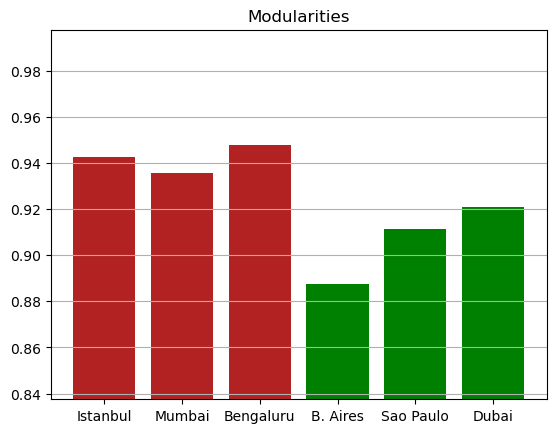

In [11]:
# Calculate the modularities from detected communities

modularities = []

for i in range(len(city_graphs)):
    G = nx.Graph(city_graphs[i])
    modularity = community_louvain.modularity(city_communities[i], G)
    modularities.append(modularity)
    print(f"Modularity of {city_names[i]}: {modularity:.5f}")
    
draw_bar(city_names, modularities, 'Modularities', 0.05)    

----- Istanbul -----


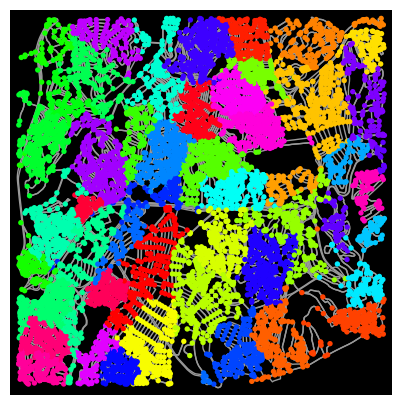

----- Mumbai -----


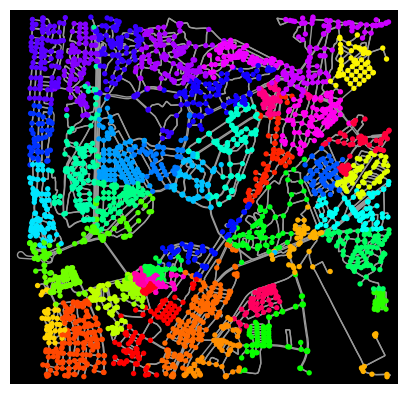

----- Bengaluru -----


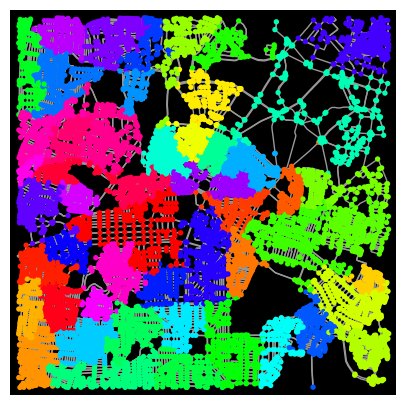

----- B. Aires -----


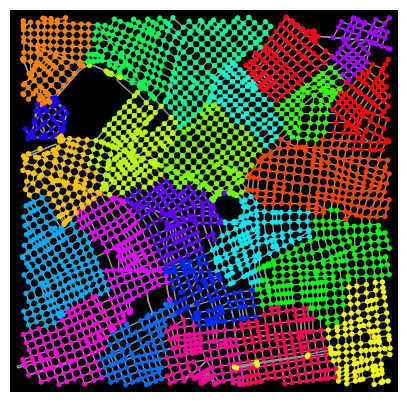

----- Sao Paulo -----


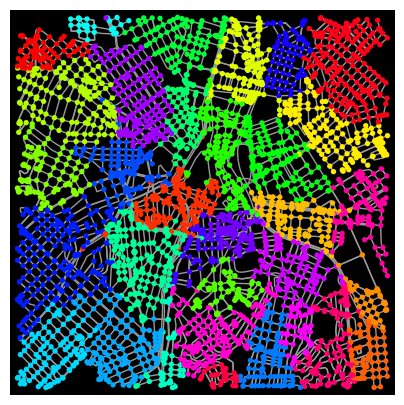

----- Dubai -----


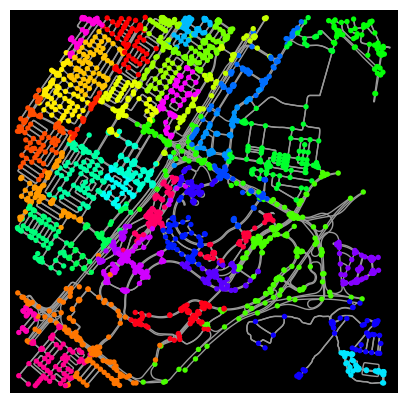

In [12]:
# Plot the map with nodes coloured by communities

for i in range(len(city_graphs)):
    print(f'----- {city_names[i]} -----')
    draw_graph(city_graphs[i], city_communities[i], 'hsv') 

In [13]:
modularity_bad_city = (sum(modularities[0:2]))/3.0
print(f"Average modularity value for bad cities nodes: {modularity_bad_city:.5f}")

modularity_good_city = (sum(modularities[3:5]))/3.0
print(f"Average modularity for good cities nodes: {modularity_good_city:.5f}")

Average modularity value for bad cities nodes: 0.62605
Average modularity for good cities nodes: 0.59962


## 2 - Degree Centrality

Degree centrality is a measure of the importance of a node in a graph based on the number of connections it has. It is used to identify the most influential nodes in a network. The degree centrality of a node is calculated by counting the number of edges incident on the node and can be normalized by dividing by the maximum possible degree. A node with a high degree centrality value is considered influential in the network.

In [14]:
degree_centralities = []
perc_degree_centralities = []
degree_domains = []

for i in range(len(city_graphs)):
    degree = nx.degree_histogram(city_graphs[i])
    perc_degree = [((d*100) / (city_graphs[i].number_of_nodes())) for d in degree]
    deg_domain = list(range(0, len(degree)))
    
    degree_centralities.append(degree)
    perc_degree_centralities.append(perc_degree)
    degree_domains.append(deg_domain)
    
    print(f"[DONE]: {city_names[i]}")

[DONE]: Istanbul
[DONE]: Mumbai
[DONE]: Bengaluru
[DONE]: B. Aires
[DONE]: Sao Paulo
[DONE]: Dubai


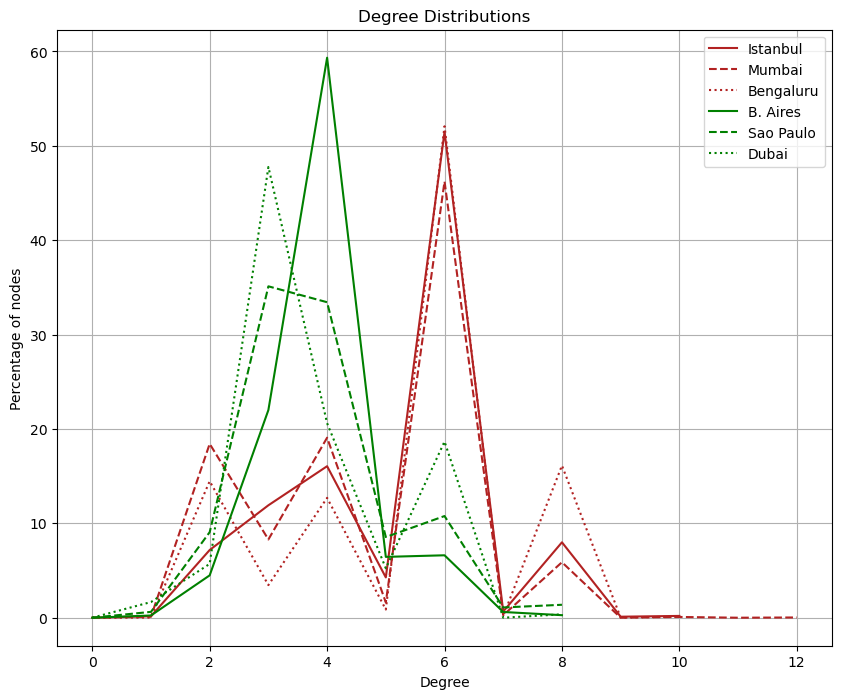

In [15]:
fig, d_graph = plt.subplots(figsize=(10,8))
d_graph.plot(degree_domains[0], perc_degree_centralities[0], color=RED, linestyle='solid', label=city_names[0])
d_graph.plot(degree_domains[1], perc_degree_centralities[1], color=RED, linestyle='dashed', label=city_names[1])
d_graph.plot(degree_domains[2], perc_degree_centralities[2], color=RED, linestyle='dotted', label=city_names[2])
d_graph.plot(degree_domains[3], perc_degree_centralities[3], color=GREEN, linestyle='solid', label=city_names[3])
d_graph.plot(degree_domains[4], perc_degree_centralities[4], color=GREEN, linestyle='dashed', label=city_names[4])
d_graph.plot(degree_domains[5], perc_degree_centralities[5], color=GREEN, linestyle='dotted', label=city_names[5])


d_graph.set_title('Degree Distributions')
d_graph.set_xlabel('Degree')
d_graph.set_ylabel('Percentage of nodes')

d_graph.legend()
d_graph.grid(True)

plt.show()

Average degree value for Istanbul's nodes: 5.16137
Average degree value for Mumbai's nodes: 4.73639
Average degree value for Bengaluru's nodes: 5.38396
Average degree value for B. Aires's nodes: 3.90888
Average degree value for Sao Paulo's nodes: 3.83739
Average degree value for Dubai's nodes: 3.79856


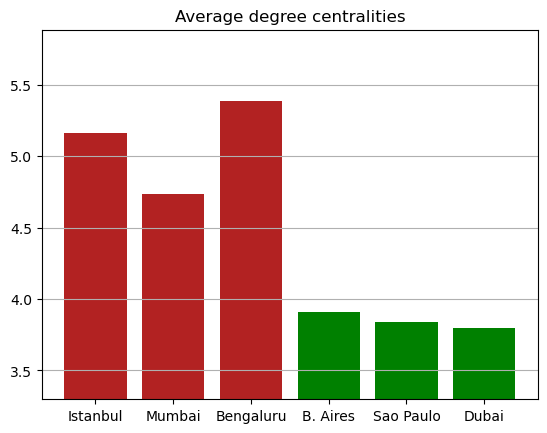

In [16]:
degree_averages = []
graph_degrees = []

for i in range(len(city_graphs)):
    graph_degree = city_graphs[i].degree()
    degree_avg = sum(dict(graph_degree).values()) / len(graph_degree)
    graph_degrees.append(graph_degree)
    degree_averages.append(degree_avg)
    
    print(f"Average degree value for {city_names[i]}'s nodes: {degree_avg:.5f}")

    
draw_bar(city_names, degree_averages, 'Average degree centralities', 0.5)

In [17]:
degree_bad_city = (sum(degree_averages[:3]))/3.0
print(f"Average degree value for bad cities nodes: {degree_bad_city:.5f}")

degree_good_city = (sum(degree_averages[3:]))/3.0
print(f"Average degree value for good cities nodes: {degree_good_city:.5f}")

Average degree value for bad cities nodes: 5.09390
Average degree value for good cities nodes: 3.84827


Entropy degree for Istanbul's nodes: 8.97506
Entropy degree for Mumbai's nodes: 8.13735
Entropy degree for Bengaluru's nodes: 9.19207
Entropy degree for B. Aires's nodes: 7.96677
Entropy degree for Sao Paulo's nodes: 8.20732
Entropy degree for Dubai's nodes: 7.87014


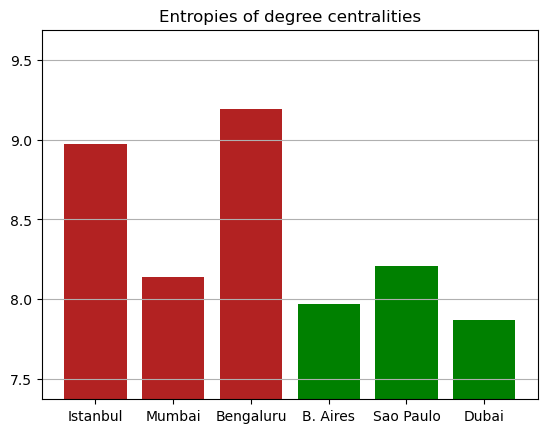

In [18]:
# Compute and print the entropy of degree value distributions

degree_entropies = []

for i in range(len(graph_degrees)):
    degree_entropy = entropy(list(dict(graph_degrees[i]).values()))
    degree_entropies.append(degree_entropy)
    
    print(f"Entropy degree for {city_names[i]}'s nodes: {degree_entropy:.5f}")

draw_bar(city_names, degree_entropies, 'Entropies of degree centralities', 0.5)

In [19]:
degrees_entropy_bad_city = (sum(degree_entropies[:3]))/3.0
print(f"Average degree entropy value for bad cities nodes: {degrees_entropy_bad_city:.5f}")

degrees_entropy_good_city = (sum(degree_entropies[3:]))/3.0
print(f"Average degree entropy value for good cities nodes: {degrees_entropy_good_city:.5f}")

Average degree entropy value for bad cities nodes: 8.76816
Average degree entropy value for good cities nodes: 8.01474


----- Istanbul -----


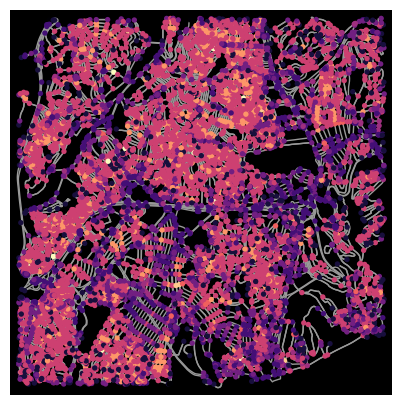

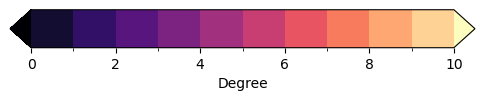

----- Mumbai -----


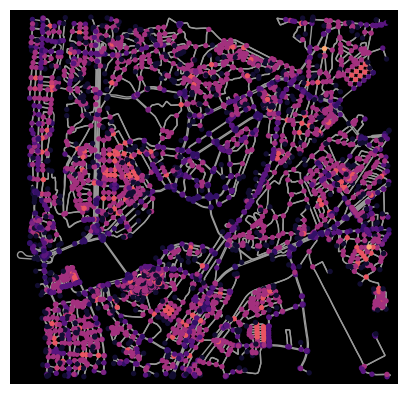

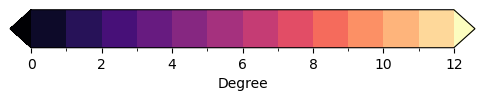

----- Bengaluru -----


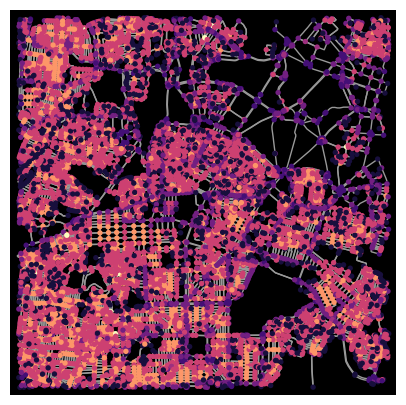

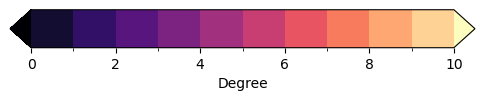

----- B. Aires -----


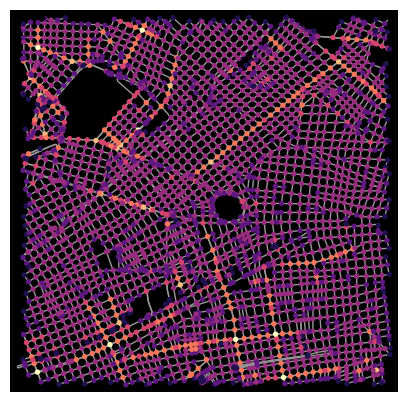

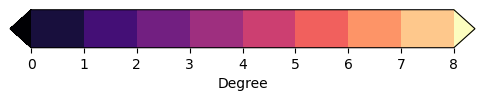

----- Sao Paulo -----


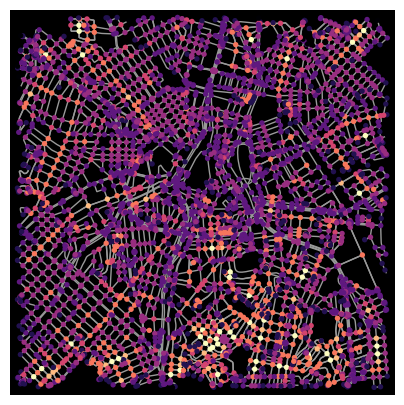

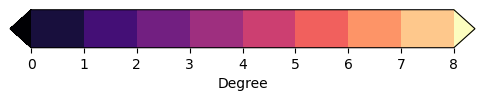

----- Dubai -----


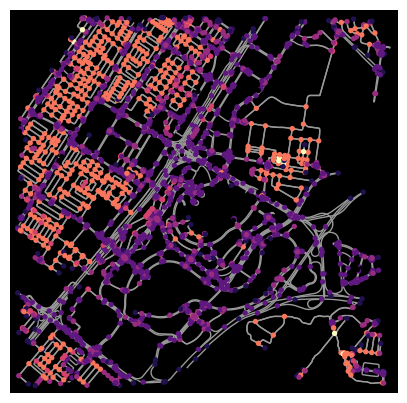

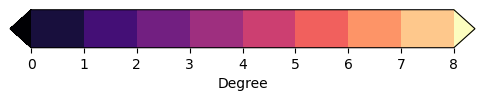

In [20]:
# Plot the map with nodes coloured by degree value

for i in range(len(city_graphs)):
    print(f'----- {city_names[i]} -----')
    nodes, edges = ox.graph_to_gdfs(city_graphs[i], nodes=True, edges=True)
    draw_graph(city_graphs[i], {x:graph_degrees[i][x] for x in nodes.index}, 'magma')
    
    # Plot the colorbar
    fig, ax = plt.subplots(figsize=(6, 1))
    fig.subplots_adjust(bottom=0.5)

    cmap = mpl.cm.magma
    norm = mpl.colors.BoundaryNorm(degree_domains[i], cmap.N, extend='both')
    fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap), cax=ax, orientation='horizontal', label="Degree")
    plt.pause(0.05)
    plt.show()

## 3 - Closeness Centrality

Closeness centrality is a measure of the centrality of a node in a graph based on the average shortest path distance from the node to all other nodes in the graph. It is used to identify the nodes that are most able to access and influence other parts of the graph. A node with a high closeness centrality value is considered well-connected and influential, while a node with a low closeness centrality value is less influential.

[DONE]: Istanbul
[DONE]: Mumbai
[DONE]: Bengaluru
[DONE]: B. Aires
[DONE]: Sao Paulo
[DONE]: Dubai


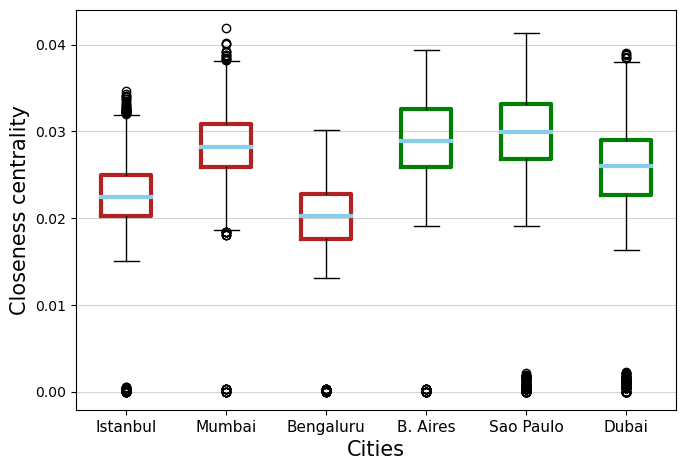

In [21]:
closeness_centralities = []

for i in range(len(city_graphs)):
    cl_cent = nx.centrality.closeness_centrality(city_graphs[i])
    closeness_centralities.append(cl_cent)
    
    print(f"[DONE]: {city_names[i]}")
    
draw_boxplot(city_names, closeness_centralities, "Cities", "Closeness centrality")

----- Istanbul -----


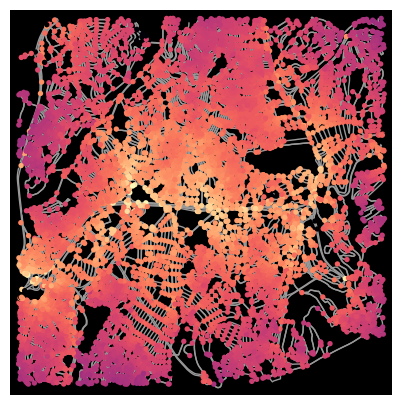

----- Mumbai -----


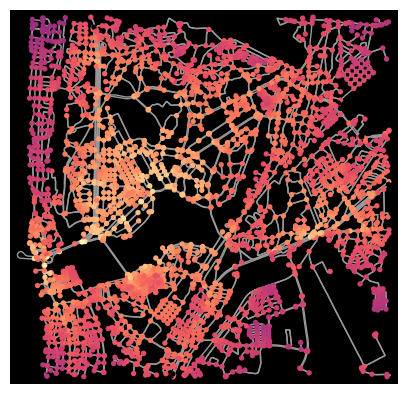

----- Bengaluru -----


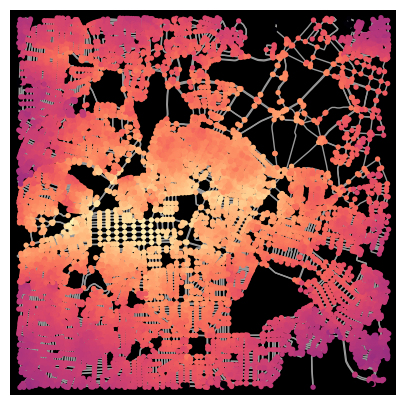

----- B. Aires -----


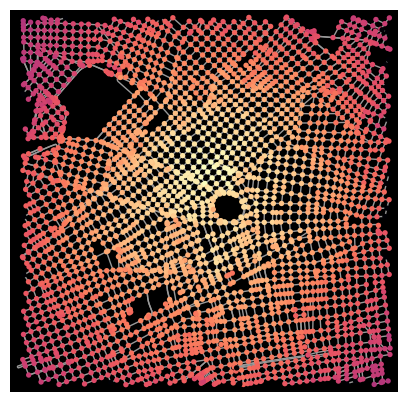

----- Sao Paulo -----


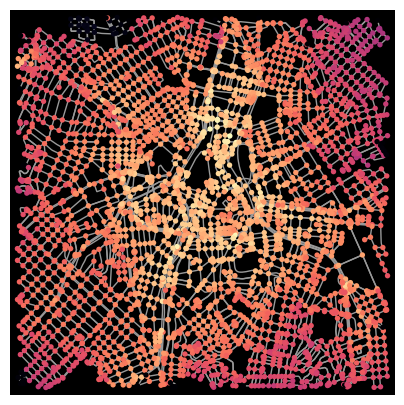

----- Dubai -----


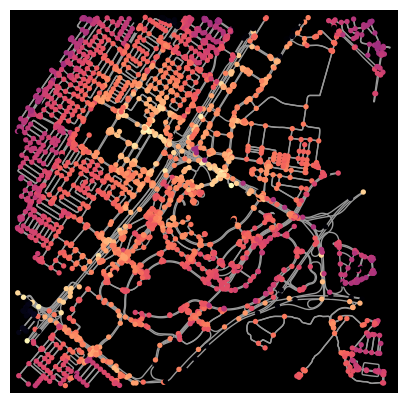

In [22]:
#Plot the map with nodes coloured by closeness value

for i in range(len(city_graphs)):
    print(f'----- {city_names[i]} -----')
    draw_graph(city_graphs[i], closeness_centralities[i], 'magma') 

Average Closeness value for Istanbul's nodes: 0.02259
Average Closeness value for Mumbai's nodes: 0.02827
Average Closeness value for Bengaluru's nodes: 0.02026
Average Closeness value for B. Aires's nodes: 0.02899
Average Closeness value for Sao Paulo's nodes: 0.02949
Average Closeness value for Dubai's nodes: 0.02519


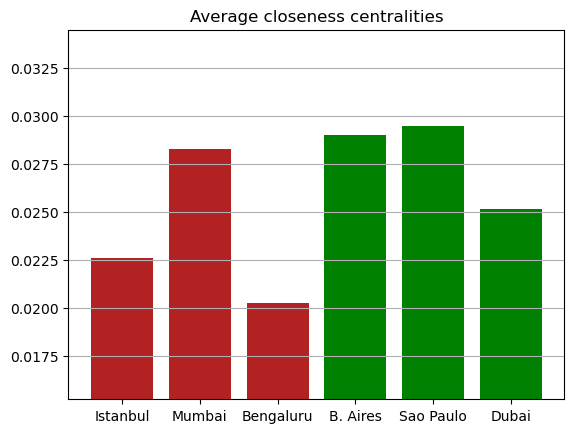

In [23]:
closeness_averages = []

for i in range(len(closeness_centralities)):
    avg_cl = sum(dict(closeness_centralities[i]).values()) / len(closeness_centralities[i])
    closeness_averages.append(avg_cl)
    print(f"Average Closeness value for {city_names[i]}'s nodes: {avg_cl:.5f}")


draw_bar(city_names, closeness_averages, 'Average closeness centralities', 0.005)

In [24]:
closeness_average_bad_city = (sum(closeness_averages[:3]))/3.0
print(f"Average Closeness value for bad cities nodes: {closeness_average_bad_city:.5f}")

closeness_average_good_city = (sum(closeness_averages[3:]))/3.0
print(f"Average Closeness value for good cities nodes: {closeness_average_good_city:.5f}")

Average Closeness value for bad cities nodes: 0.02371
Average Closeness value for good cities nodes: 0.02789


Entropy Closeness values for Istanbul's nodes: 9.01309
Entropy Closeness values for Mumbai's nodes: 8.20134
Entropy Closeness values for Bengaluru's nodes: 9.24254
Entropy Closeness values for B. Aires's nodes: 7.97419
Entropy Closeness values for Sao Paulo's nodes: 8.23042
Entropy Closeness values for Dubai's nodes: 7.87579


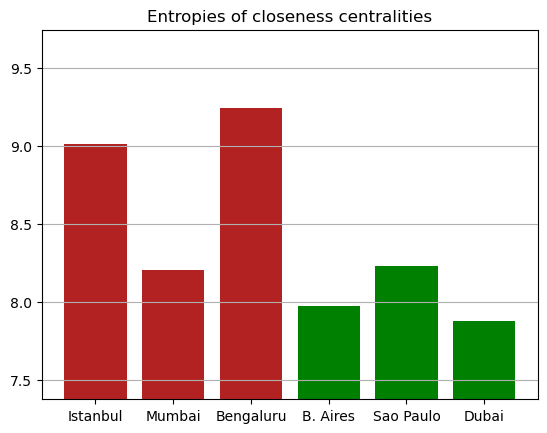

In [25]:
closeness_entropies = []

for i in range(len(closeness_centralities)):
    cl_entropy = entropy(list(dict(closeness_centralities[i]).values()))
    print(f"Entropy Closeness values for {city_names[i]}'s nodes: {cl_entropy:.5f}")
    closeness_entropies.append(cl_entropy)

draw_bar(city_names, closeness_entropies, 'Entropies of closeness centralities', 0.5)

In [26]:
closeness_entropy_bad_city = (sum(closeness_entropies[:3]))/3.0
print(f"Average closeness entropy value for bad cities nodes: {closeness_entropy_bad_city:.5f}")

closeness_entropy_good_city = (sum(closeness_entropies[3:]))/3.0
print(f"Average closeness entropy value for good cities nodes: {closeness_entropy_good_city:.5f}")

Average closeness entropy value for bad cities nodes: 8.81899
Average closeness entropy value for good cities nodes: 8.02680


## 4 - Betweenness Centrality

Betweenness centrality is a measure of the centrality of a node in a graph based on the number of shortest paths that pass through the node. It is used to identify the nodes that are most able to control the flow of information or resources in the graph. A node with a high betweenness centrality value is considered a key intermediary in the graph, while a node with a low betweenness centrality value is less important as an intermediary.

[DONE]: Istanbul
[DONE]: Mumbai
[DONE]: Bengaluru
[DONE]: B. Aires
[DONE]: Sao Paulo
[DONE]: Dubai


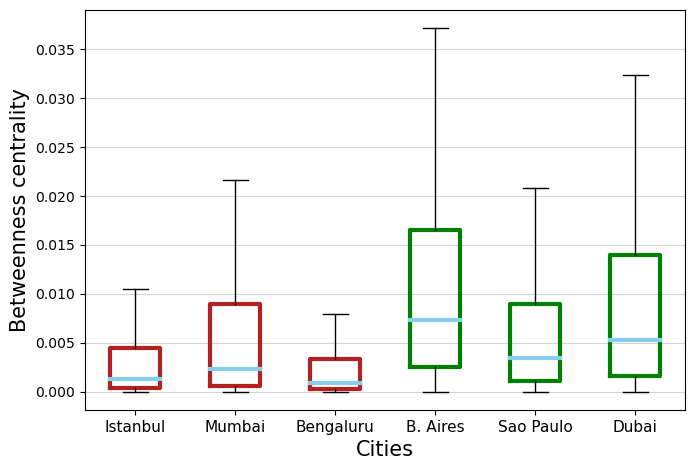

In [57]:
betweenness_centralities = []

for i in range(len(city_graphs)):
    bt_cent = nx.centrality.betweenness_centrality(city_graphs[i], endpoints=False)
    betweenness_centralities.append(bt_cent)
    
    print(f"[DONE]: {city_names[i]}")
    
draw_boxplot_no(city_names, betweenness_centralities, "Cities", "Betweenness centrality")

----- Istanbul -----


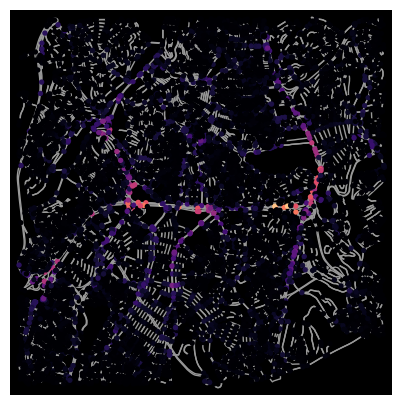

----- Mumbai -----


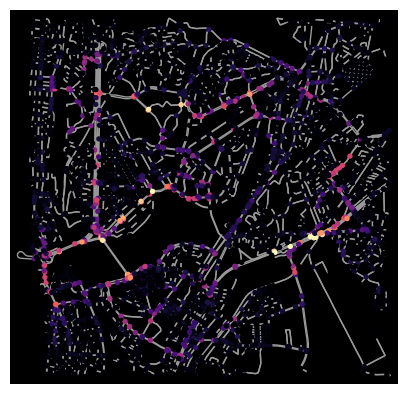

----- Bengaluru -----


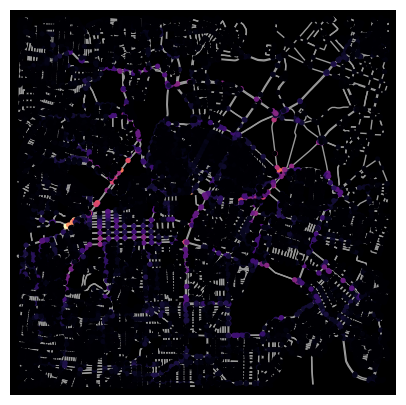

----- B. Aires -----


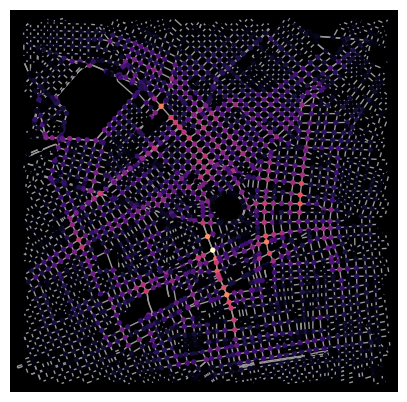

----- Sao Paulo -----


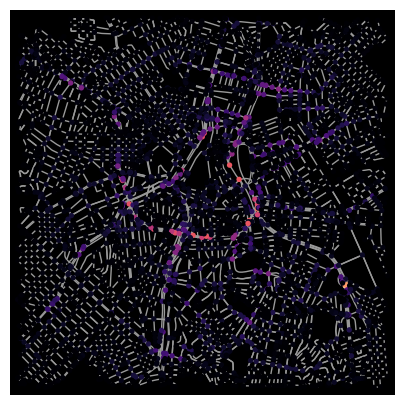

----- Dubai -----


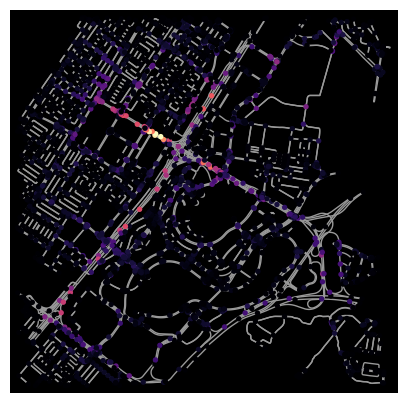

In [28]:
#Plot the map with nodes coloured by betweenness value

for i in range(len(city_graphs)):
    print(f'----- {city_names[i]} -----')
    draw_graph(city_graphs[i], betweenness_centralities[i], 'magma') 

Average Betweenness value for Istanbul's nodes: 0.00508
Average Betweenness value for Mumbai's nodes: 0.00935
Average Betweenness value for Bengaluru's nodes: 0.00470
Average Betweenness value for B. Aires's nodes: 0.01115
Average Betweenness value for Sao Paulo's nodes: 0.00807
Average Betweenness value for Dubai's nodes: 0.01139


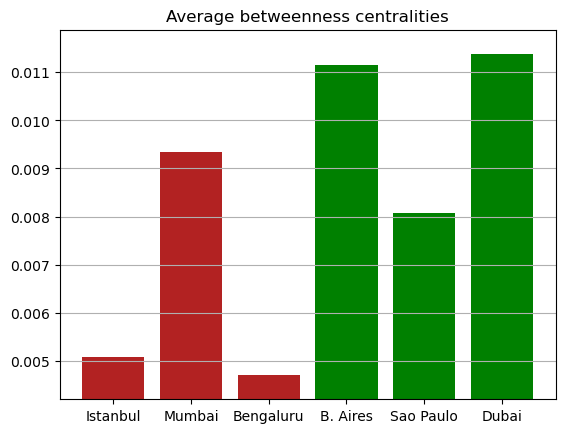

In [29]:
betweenness_averages = []

for i in range(len(betweenness_centralities)):
    btw_avg = sum(dict(betweenness_centralities[i]).values()) / len(betweenness_centralities[i])
    betweenness_averages.append(btw_avg)
    print(f"Average Betweenness value for {city_names[i]}'s nodes: {btw_avg:.5f}")

draw_bar(city_names, betweenness_averages, 'Average betweenness centralities', 0.0005)

In [30]:
betweenness_average_bad_city = (sum(betweenness_averages[:3]))/3.0
print(f"Average Betweenness value for bad cities nodes: {betweenness_average_bad_city:.5f}")

betweenness_average_good_city = (sum(betweenness_averages[3:]))/3.0
print(f"Average Betweenness value for good cities nodes: {betweenness_average_good_city:.5f}")

Average Betweenness value for bad cities nodes: 0.00637
Average Betweenness value for good cities nodes: 0.01020


Entropy Betweenness values for Istanbul's nodes: 7.86991
Entropy Betweenness values for Mumbai's nodes: 7.15682
Entropy Betweenness values for Bengaluru's nodes: 7.89863
Entropy Betweenness values for B. Aires's nodes: 7.52794
Entropy Betweenness values for Sao Paulo's nodes: 7.44185
Entropy Betweenness values for Dubai's nodes: 7.17816


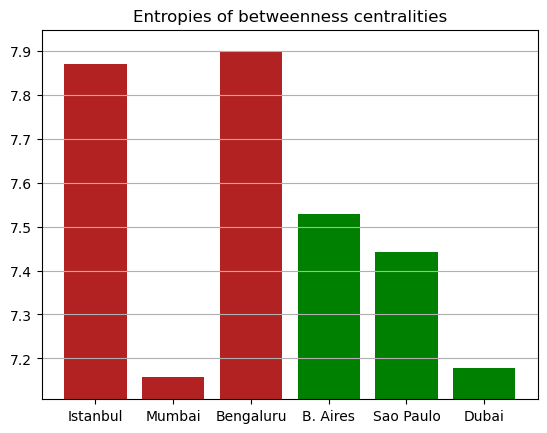

In [31]:
betweenness_entropies = []

for i in range(len(betweenness_centralities)):
    btw_entr = entropy(list(dict(betweenness_centralities[i]).values()))
    betweenness_entropies.append(btw_entr)
    print(f"Entropy Betweenness values for {city_names[i]}'s nodes: {btw_entr:.5f}")

draw_bar(city_names, betweenness_entropies, 'Entropies of betweenness centralities', 0.05)

In [32]:
betweenness_entropy_bad_city = (sum(betweenness_entropies[:3]))/3.0
print(f"Entropy Betweenness value for bad cities nodes: {betweenness_entropy_bad_city:.5f}")

betweenness_entropy_good_city = (sum(betweenness_entropies[3:]))/3.0
print(f"Entropy Betweenness value for good cities nodes: {betweenness_entropy_good_city:.5f}")

Entropy Betweenness value for bad cities nodes: 7.64179
Entropy Betweenness value for good cities nodes: 7.38265


## 5 - Eigenvector Centrality

Eigenvector centrality is a measure of the centrality of a node in a graph based on the idea that connections to high-centrality nodes contribute more to the centrality of a node than connections to low-centrality nodes. It is used to identify the most influential nodes in a network. A node with a high eigenvector centrality value has many connections to other high-centrality nodes and is therefore considered influential, while a node with a low eigenvector centrality value is less influential.

In [33]:
eigenvector_centralities = []

for i in range(len(city_graphs)):
    eig_cent = nx.eigenvector_centrality(nx.DiGraph(city_graphs[i]), max_iter=10000)
    eigenvector_centralities.append(eig_cent)
    
    print(f"[DONE]: {city_names[i]}")

[DONE]: Istanbul
[DONE]: Mumbai
[DONE]: Bengaluru
[DONE]: B. Aires
[DONE]: Sao Paulo
[DONE]: Dubai


In [34]:
# Sampling 10,000 nodes from good and bad cities for visualization

bad_eig = list(eigenvector_centralities[0].values()) + list(eigenvector_centralities[1].values()) + list(eigenvector_centralities[2].values())
good_eig = list(eigenvector_centralities[3].values()) + list(eigenvector_centralities[4].values()) + list(eigenvector_centralities[5].values())

# Set the number of elements to keep in the subsampled
n_elements = 10000

# Create empty lists to store the subsampled
sub_bad_eig = []
sub_good_eig = []

# Select n_elements random elements from each array
for i in range(n_elements):
    sub_bad_eig.append(random.choice(bad_eig))
    sub_good_eig.append(random.choice(good_eig))

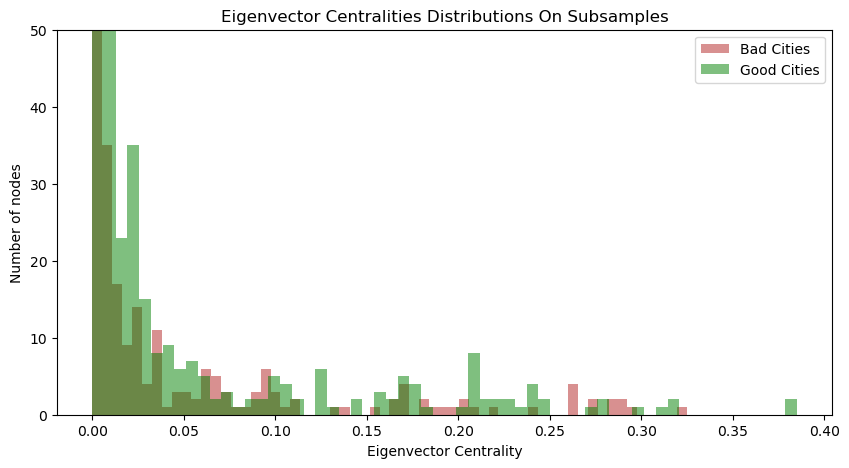

In [35]:
plt.figure(figsize=(10, 5))

plt.hist(sub_bad_eig, bins=60, alpha=0.5, color=RED, label="Bad Cities")
plt.hist(sub_good_eig, bins=60, alpha=0.5, color=GREEN, label="Good Cities")

plt.legend()
plt.title('Eigenvector Centralities Distributions On Subsamples')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Number of nodes')
plt.ylim([0.0, 50]) # First bins are near 9000-10000 nodes, this plot is to observe distribution of outliers.
plt.show()

----- Istanbul -----


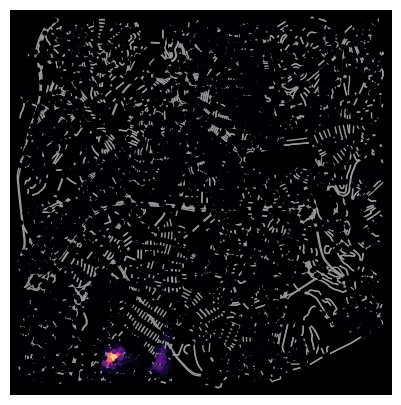

----- Mumbai -----


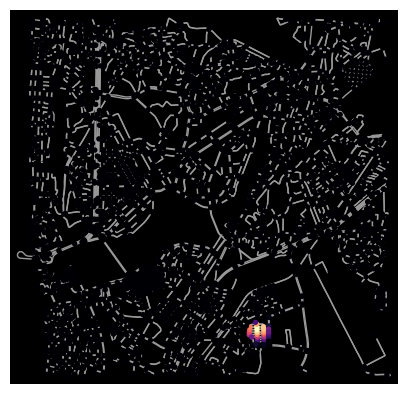

----- Bengaluru -----


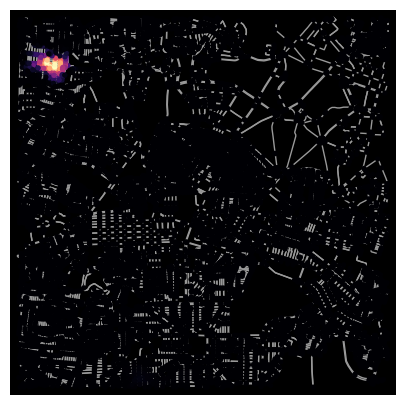

----- B. Aires -----


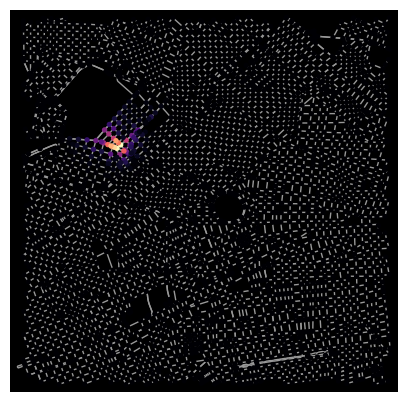

----- Sao Paulo -----


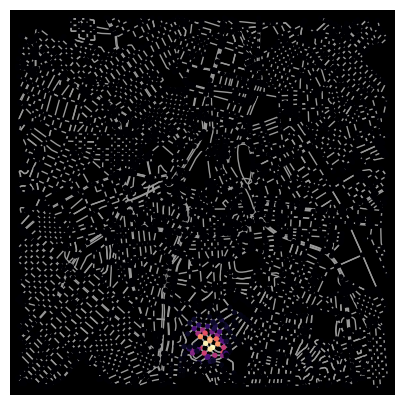

----- Dubai -----


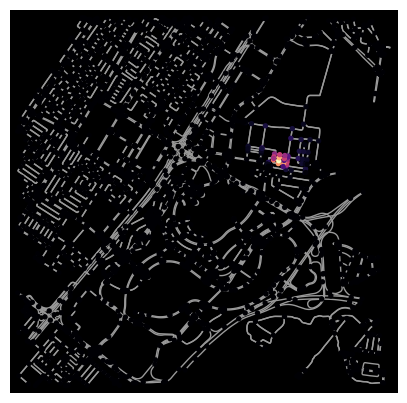

In [36]:
#Plot the map with nodes coloured by eigenvector value

for i in range(len(city_graphs)):
    print(f'----- {city_names[i]} -----')
    draw_graph(city_graphs[i], eigenvector_centralities[i], 'magma')   

Average eigenvector value for Istanbul's nodes: 0.00101
Average eigenvector value for Mumbai's nodes: 0.00132
Average eigenvector value for Bengaluru's nodes: 0.00085
Average eigenvector value for B. Aires's nodes: 0.00224
Average eigenvector value for Sao Paulo's nodes: 0.00169
Average eigenvector value for Dubai's nodes: 0.00191


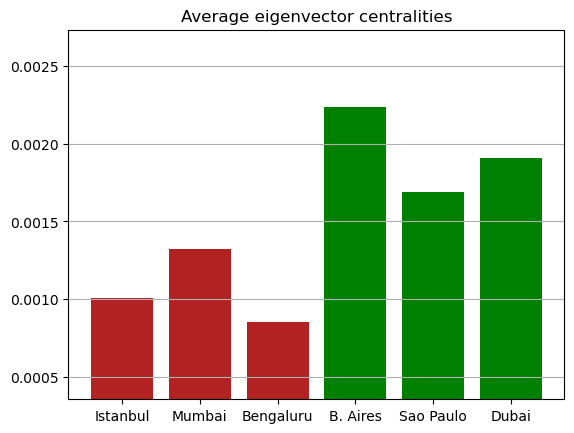

In [37]:
eigenvector_averages = []

for i in range(len(eigenvector_centralities)):
    eig_avg = sum(dict(eigenvector_centralities[i]).values()) / len(eigenvector_centralities[i])
    eigenvector_averages.append(eig_avg)
    print(f"Average eigenvector value for {city_names[i]}'s nodes: {eig_avg:.5f}")

draw_bar(city_names, eigenvector_averages, 'Average eigenvector centralities', 0.0005)

In [38]:
eigenvector_average_bad_city = (sum(eigenvector_averages[:3]))/3.0
print(f"Average eigenvector value for bad cities nodes: {eigenvector_average_bad_city:.5f}")

eigenvector_average_good_city = (sum(eigenvector_averages[3:]))/3.0
print(f"Average eigenvector value for good cities nodes: {eigenvector_average_good_city:.5f}")

Average eigenvector value for bad cities nodes: 0.00106
Average eigenvector value for good cities nodes: 0.00194


Entropy eigenvector values for Istanbul's nodes: 4.80802
Entropy eigenvector values for Mumbai's nodes: 3.47358
Entropy eigenvector values for Bengaluru's nodes: 4.80456
Entropy eigenvector values for B. Aires's nodes: 4.33791
Entropy eigenvector values for Sao Paulo's nodes: 4.21124
Entropy eigenvector values for Dubai's nodes: 3.72050


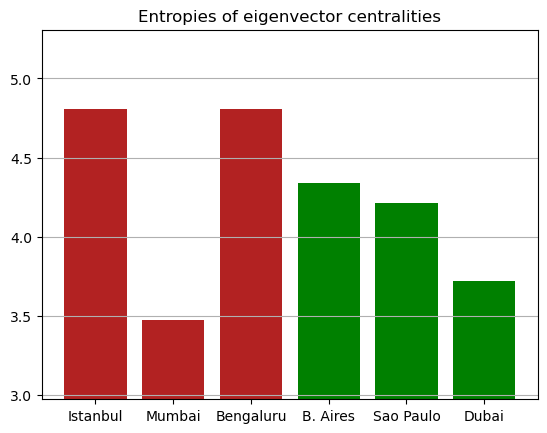

In [39]:
eigenvector_entropies = []

for i in range(len(eigenvector_centralities)):
    eig_ent = entropy(list(dict(eigenvector_centralities[i]).values()))
    eigenvector_entropies.append(eig_ent)
    print(f"Entropy eigenvector values for {city_names[i]}'s nodes: {eig_ent:.5f}")

draw_bar(city_names, eigenvector_entropies, 'Entropies of eigenvector centralities', 0.5)

In [40]:
eigenvector_entropy_bad_city = (sum(eigenvector_entropies[:3]))/3.0
print(f"Entropy eigenvector value for bad cities nodes: {eigenvector_entropy_bad_city:.5f}")

eigenvector_entropy_good_city = (sum(eigenvector_entropies[3:]))/3.0
print(f"Entropy eigenvector value for good cities nodes: {eigenvector_entropy_good_city:.5f}")

Entropy eigenvector value for bad cities nodes: 4.36205
Entropy eigenvector value for good cities nodes: 4.08988


## 6 - PageRank Centrality

PageRank centrality is an algorithm used to evaluate the importance or relevance of nodes in a network. It assigns a score to each node based on the number and quality of links (or edges) pointing to it. It is used to rank web pages in search engines, but it can also be applied to other types of networks to identify key players or important nodes.

[DONE]: Istanbul
[DONE]: Mumbai
[DONE]: Bengaluru
[DONE]: B. Aires
[DONE]: Sao Paulo
[DONE]: Dubai


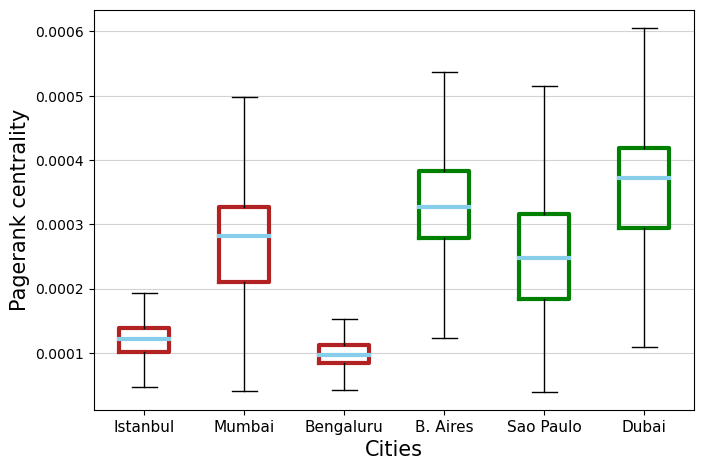

In [56]:
pagerank_centralities = []

for i in range(len(city_graphs)):
    pagerank = nx.pagerank(city_graphs[i])
    pagerank_centralities.append(pagerank)
    
    print(f"[DONE]: {city_names[i]}")
    
draw_boxplot_no(city_names, pagerank_centralities, "Cities", "Pagerank centrality")

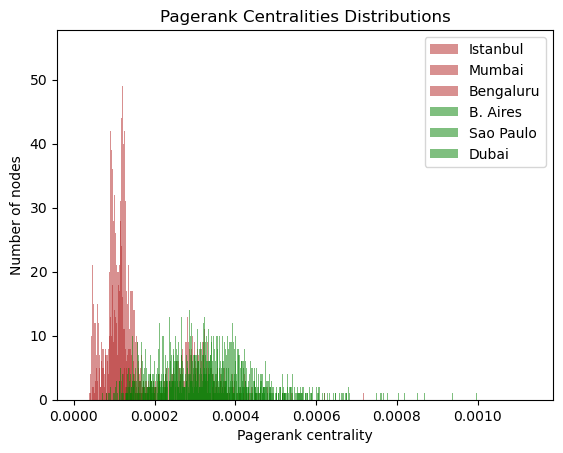

In [42]:
for i in range(len(city_graphs)):
    if(i<3):
        plt.hist(list(pagerank_centralities[i].values()), bins=2000, alpha=0.5, color=RED, label=city_names[i])
    else:
        plt.hist(list(pagerank_centralities[i].values()), bins=2000, alpha=0.5, color=GREEN, label=city_names[i])

# Add labels and legend
plt.title('Pagerank Centralities Distributions')
plt.xlabel('Pagerank centrality')
plt.ylabel('Number of nodes')
plt.legend()
plt.show()

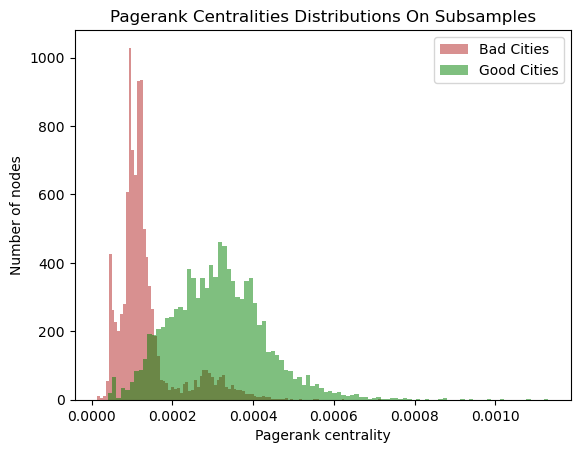

In [43]:
# Now overall pagerank distribution comparison of good and bad classes
# Sampling 10,000 nodes from good and bad cities for visualization

bad_pr = list(pagerank_centralities[0].values()) + list(pagerank_centralities[1].values()) + list(pagerank_centralities[2].values())
good_pr = list(pagerank_centralities[3].values()) + list(pagerank_centralities[4].values()) + list(pagerank_centralities[5].values())

# Set the number of elements to keep in the subsampled
n_elements = 10000

# Create empty lists to store the subsampled
sub_bad_pr = []
sub_good_pr = []

# Select n_elements random elements from each array
for i in range(n_elements):
    sub_bad_pr.append(random.choice(bad_pr))
    sub_good_pr.append(random.choice(good_pr))
    

    
plt.hist(sub_bad_pr, bins=100, alpha=0.5, color=RED, label="Bad Cities")
plt.hist(sub_good_pr, bins=100, alpha=0.5, color=GREEN, label="Good Cities")

plt.legend()
plt.title('Pagerank Centralities Distributions On Subsamples')
plt.xlabel('Pagerank centrality')
plt.ylabel('Number of nodes')
plt.show()

----- Istanbul -----


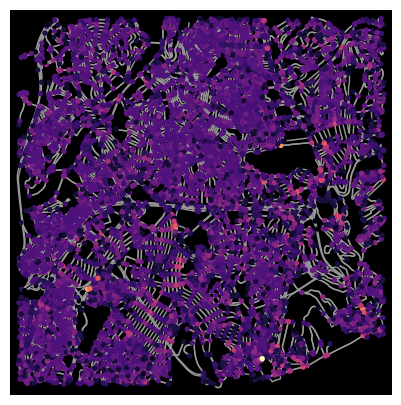

----- Mumbai -----


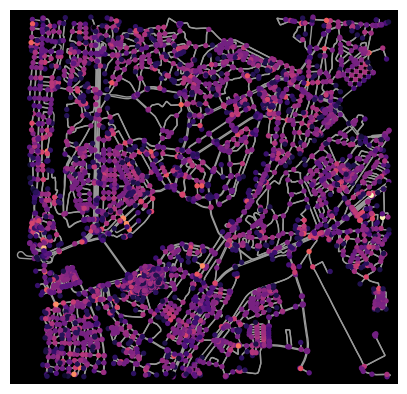

----- Bengaluru -----


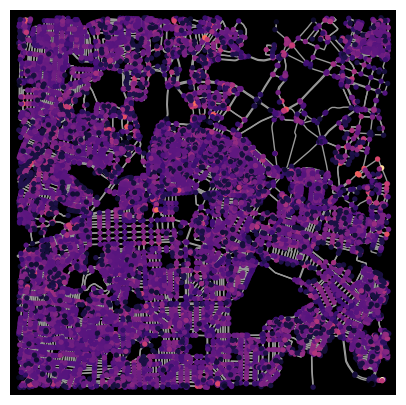

----- B. Aires -----


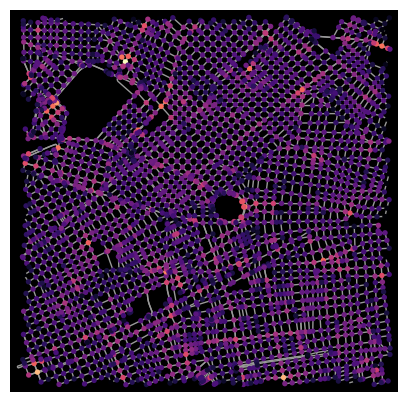

----- Sao Paulo -----


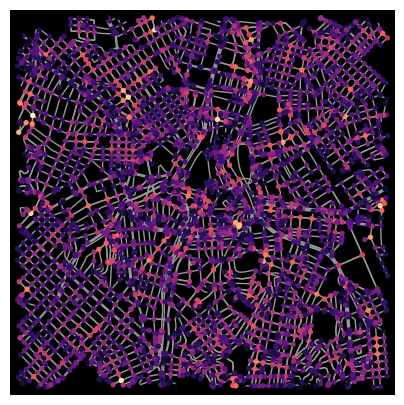

----- Dubai -----


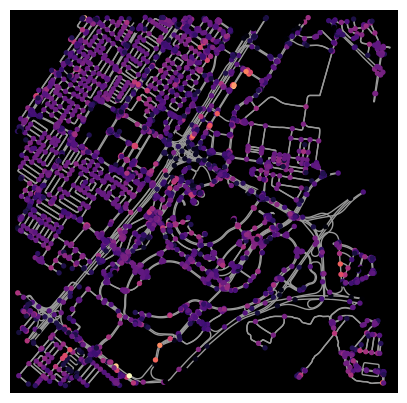

In [44]:
#Plot the map with nodes coloured by pagerank value

for i in range(len(city_graphs)):
    print(f'----- {city_names[i]} -----')
    draw_graph(city_graphs[i], pagerank_centralities[i], 'magma')  

Average pagerank value for Istanbul's nodes: 0.00012
Average pagerank value for Mumbai's nodes: 0.00027
Average pagerank value for Bengaluru's nodes: 0.00010
Average pagerank value for B. Aires's nodes: 0.00034
Average pagerank value for Sao Paulo's nodes: 0.00026
Average pagerank value for Dubai's nodes: 0.00036


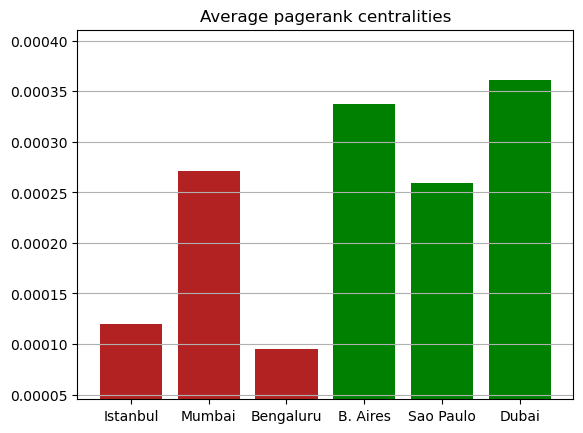

In [45]:
pagerank_averages = []

for i in range(len(pagerank_centralities)):
    pr_avg = sum(dict(pagerank_centralities[i]).values()) / len(pagerank_centralities[i])
    pagerank_averages.append(pr_avg)
    print(f"Average pagerank value for {city_names[i]}'s nodes: {pr_avg:.5f}")

draw_bar(city_names, pagerank_averages, 'Average pagerank centralities', 0.00005)

In [46]:
pagerank_average_bad_city = (sum(pagerank_averages[:3]))/3.0
print(f"Average pagerank value for bad cities nodes: {pagerank_average_bad_city:.5f}")

pagerank_average_good_city = (sum(pagerank_averages[3:]))/3.0
print(f"Average pagerank value for good cities nodes: {pagerank_average_good_city:.5f}")

Average pagerank value for bad cities nodes: 0.00016
Average pagerank value for good cities nodes: 0.00032


Entropy pagerank values for Istanbul's nodes: 8.98627
Entropy pagerank values for Mumbai's nodes: 8.16060
Entropy pagerank values for Bengaluru's nodes: 9.21660
Entropy pagerank values for B. Aires's nodes: 7.94553
Entropy pagerank values for Sao Paulo's nodes: 8.18208
Entropy pagerank values for Dubai's nodes: 7.87135


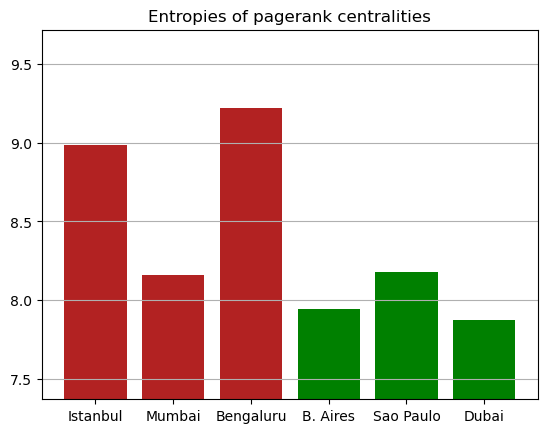

In [47]:
pagerank_entropies = []

for i in range(len(pagerank_centralities)):
    pr_ent = entropy(list(dict(pagerank_centralities[i]).values()))
    pagerank_entropies.append(pr_ent)
    print(f"Entropy pagerank values for {city_names[i]}'s nodes: {pr_ent:.5f}")

draw_bar(city_names, pagerank_entropies, 'Entropies of pagerank centralities', 0.5)

In [48]:
pagerank_entropy_bad_city = (sum(pagerank_entropies[:3]))/3.0
print(f"Entropy pagerank value for bad cities nodes: {pagerank_entropy_bad_city:.5f}")

pagerank_entropy_good_city = (sum(pagerank_entropies[3:]))/3.0
print(f"Entropy pagerank value for good cities nodes: {pagerank_entropy_good_city:.5f}")

Entropy pagerank value for bad cities nodes: 8.78782
Entropy pagerank value for good cities nodes: 7.99966


## Overall Comparisons
*Merely for relative comparison*

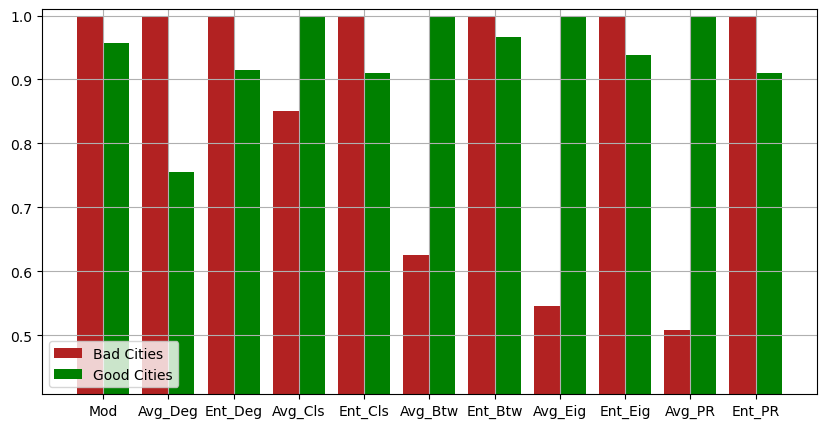

In [49]:
labels = ["Mod", "Avg_Deg", "Ent_Deg", "Avg_Cls", "Ent_Cls", "Avg_Btw", 
          "Ent_Btw", "Avg_Eig", "Ent_Eig", "Avg_PR", "Ent_PR"]

x = np.arange(len(labels))

bad_y = [modularity_bad_city/(max(modularity_bad_city, modularity_good_city)),
    degree_bad_city/(max(degree_bad_city, degree_good_city)), 
    degrees_entropy_bad_city/(max(degrees_entropy_bad_city, degrees_entropy_good_city)),
    closeness_average_bad_city/(max(closeness_average_bad_city, closeness_average_good_city)),
    closeness_entropy_bad_city/(max(closeness_entropy_bad_city, closeness_entropy_good_city)),
    betweenness_average_bad_city/(max(betweenness_average_bad_city, betweenness_average_good_city)),
    betweenness_entropy_bad_city/(max(betweenness_entropy_bad_city, betweenness_entropy_good_city)),
    eigenvector_average_bad_city/(max(eigenvector_average_bad_city, eigenvector_average_good_city)),
    eigenvector_entropy_bad_city/(max(eigenvector_entropy_bad_city, eigenvector_entropy_good_city)),
    pagerank_average_bad_city/(max(pagerank_average_bad_city, pagerank_average_good_city)),
    pagerank_entropy_bad_city/(max(pagerank_entropy_bad_city, pagerank_entropy_good_city))]

good_y = [modularity_good_city/(max(modularity_bad_city, modularity_good_city)),
    degree_good_city/(max(degree_bad_city, degree_good_city)), 
    degrees_entropy_good_city/(max(degrees_entropy_bad_city, degrees_entropy_good_city)),
    closeness_average_good_city/(max(closeness_average_bad_city, closeness_average_good_city)),
    closeness_entropy_good_city/(max(closeness_entropy_bad_city, closeness_entropy_good_city)),
    betweenness_average_good_city/(max(betweenness_average_bad_city, betweenness_average_good_city)),
    betweenness_entropy_good_city/(max(betweenness_entropy_bad_city, betweenness_entropy_good_city)),
    eigenvector_average_good_city/(max(eigenvector_average_bad_city, eigenvector_average_good_city)),
    eigenvector_entropy_good_city/(max(eigenvector_entropy_bad_city, eigenvector_entropy_good_city)),
    pagerank_average_good_city/(max(pagerank_average_bad_city, pagerank_average_good_city)),
    pagerank_entropy_good_city/(max(pagerank_entropy_bad_city, pagerank_entropy_good_city))]

fig, ax = plt.subplots(figsize=(10,5))

ax.bar(x-0.2, bad_y, color=RED, width=0.4, label='Bad Cities')
ax.bar(x+0.2, good_y, color=GREEN, width=0.4, label='Good Cities')

ax.set_ylim([min(min(bad_y),min(good_y))-0.1, 1.01])
ax.set_xticks(x, labels)

ax.legend(loc=3)
ax.grid(True)
plt.show()